<a href="https://colab.research.google.com/github/aarare/helsinki_city_bikes_EDA/blob/main/Helsinki_City_Bikes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [1]:
import plotly.io as pio
pio.renderers.default = "colab"

# Download dataset using kaggle API

In [3]:
! pip install -q kaggle

In [4]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ararearare","key":"6fccc7a4bad9725278a2999d9cec6cd3"}'}

In [5]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
!kaggle datasets download -d geometrein/helsinki-city-bikes

Dataset URL: https://www.kaggle.com/datasets/geometrein/helsinki-city-bikes
License(s): CC-BY-SA-4.0
 99% 425M/429M [00:07<00:00, 67.4MB/s]
100% 429M/429M [00:07<00:00, 63.6MB/s]


In [8]:
!unzip helsinki-city-bikes.zip

Archive:  helsinki-city-bikes.zip
  inflating: database.csv            


In [9]:
df = pd.read_csv("/content/database.csv", low_memory=False) # set low_memory=False since I got error columns(2,4) have mixed type

In [10]:
df.head()

,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC)
0,2020-03-23 06:09:44,2020-03-23 06:16:26,86,Kuusitie,111.0,Esterinportti,1747.000,401.000,0.261,60.195,24.902,60.198,24.927,0.900
1,2020-03-23 06:11:58,2020-03-23 06:26:31,26,Kamppi (M),10.0,Kasarmitori,1447.000,869.000,0.100,60.169,24.931,60.165,24.949,0.900
2,2020-03-23 06:16:29,2020-03-23 06:24:23,268,Porolahden koulu,254.0,Agnetankuja,1772.000,469.000,0.227,60.196,25.054,60.187,25.036,0.900
3,2020-03-23 06:33:53,2020-03-23 07:14:03,751,Vallipolku,106.0,Korppaanmäentie,7456.000,2406.000,0.186,60.228,24.820,60.203,24.899,0.900
4,2020-03-23 06:36:09,2020-03-23 07:04:10,62,Länsisatamankatu,121.0,Vilhonvuorenkatu,7120.000,1679.000,0.254,60.159,24.910,60.186,24.968,0.900


# Investigation of Dataset

In [11]:
def check_df(dataframe):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("\n##################### Columns #####################")
    print(dataframe.columns)
    print("\n##################### Info #####################")
    dataframe.info()
    print("\n##################### Types #####################")
    print(dataframe.dtypes)
    print("\n##################### Head #####################")
    print(dataframe.head())
    print("\n##################### Tail #####################")
    print(dataframe.tail())
    print("\n##################### Sum of NA #####################")
    print(dataframe.isnull().sum())

In [12]:
check_df(df)

##################### Shape #####################
(12157458, 14)

##################### Columns #####################
Index(['departure', 'return', 'departure_id', 'departure_name', 'return_id', 'return_name',
       'distance (m)', 'duration (sec.)', 'avg_speed (km/h)', 'departure_latitude',
       'departure_longitude', 'return_latitude', 'return_longitude', 'Air temperature (degC)'],
      dtype='object')

##################### Info #####################
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12157458 entries, 0 to 12157457
Data columns (total 14 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   departure               object 
 1   return                  object 
 2   departure_id            object 
 3   departure_name          object 
 4   return_id               object 
 5   return_name             object 
 6   distance (m)            float64
 7   duration (sec.)         float64
 8   avg_speed (km/h)        float64
 9   departure_l

# Investigation of descriptive statistics

In [13]:
df.describe().T

# Here distance and avg_speed have negative values, interesting! I must check them.
# And dataset has some outlier values like in distance, duration and avg_speed.

,count,mean,std,min,25%,50%,75%,max
distance (m),12157458.000,2295.275,24520.672,-4292467.000,1000.000,1739.000,2869.000,3681399.000
duration (sec.),12157458.000,959.775,7346.528,0.000,344.000,586.000,971.000,5401659.000
avg_speed (km/h),12153908.000,0.336,34.280,-468.900,0.147,0.186,0.220,16991.035
departure_latitude,12157458.000,60.180,0.017,60.148,60.167,60.176,60.190,60.239
departure_longitude,12157458.000,24.920,0.058,24.721,24.910,24.934,24.950,25.106
return_latitude,12157457.000,60.180,0.017,60.148,60.167,60.176,60.190,60.239
return_longitude,12157457.000,24.920,0.058,24.721,24.910,24.934,24.950,25.106
Air temperature (degC),12141556.000,15.650,5.498,-5.200,12.300,16.400,19.300,32.900


In [14]:
# departure and return are datetime originally but here they are object. So, I must change the dtypes of them

df[['departure','return']] =  df[['departure','return']].apply(pd.to_datetime, format='%Y-%m-%d %H:%M:%S')

In [15]:
df[['departure','return']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12157458 entries, 0 to 12157457
Data columns (total 2 columns):
 #   Column     Dtype         
---  ------     -----         
 0   departure  datetime64[ns]
 1   return     datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 185.5 MB


In [16]:
print(df[df["distance (m)"] < 0].index)
df[df["distance (m)"] < 0]

Index([1456090, 1669654, 1783328, 1912295, 2294615, 6888855, 10027503], dtype='int64')


,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC)
1456090,2020-07-04 12:26:49,2020-07-04 12:49:33,140,Verkatehtaanpuisto,226.0,Lepolantie,-4289957.000,1362.000,-188.985,60.214,24.980,60.239,24.929,16.400
1669654,2020-07-17 17:05:32,2020-07-17 17:33:08,208,Valimotie,547.0,Jämeräntaival,-4286859.000,1654.000,-155.509,60.216,24.876,60.188,24.835,23.600
1783328,2020-07-23 21:36:33,2020-07-23 21:47:05,44,Sörnäinen (M),141.0,Intiankatu,-4292467.000,633.000,-406.869,60.188,24.961,60.208,24.968,13.500
1912295,2020-07-31 23:45:28,2020-08-01 00:09:21,559,Pohjankulma,163.0,Lehtisaarentie,-4291050.000,1430.000,-180.044,60.183,24.794,60.182,24.850,15.500
2294615,2020-08-20 16:08:40,2020-08-20 16:29:36,757,Painiitty,100.0,Teljäntie,-4290278.000,1255.000,-205.113,60.235,24.831,60.210,24.869,21.800
6888855,2019-10-27 20:13:52,2019-10-27 20:23:02,579,Niittymaa,517.0,Länsituuli,-4290436.000,549.000,-468.900,60.171,24.776,60.175,24.802,1.900
10027503,2018-10-15 19:01:14,2018-10-15 19:16:20,135.0,Velodrominrinne,40.0,Hakaniemi (M),-4286564.000,905.000,-284.192,60.201,24.944,60.178,24.952,12.000


In [17]:
print(df[df["avg_speed (km/h)"] < 0].index)

Index([1456090, 1669654, 1783328, 1912295, 2294615, 6888855, 10027503], dtype='int64')


It is realized that same indices above have negative values in both of distance and avg_speed. So, I removed these indices from the dataset.

In [18]:
df.drop([1456090, 1669654, 1783328, 1912295, 2294615, 6888855, 10027503], axis=0, inplace=True)

# Univarite Variable Analysis

In [19]:
def column_detection(dataframe: pd.DataFrame, cat_th: int = 10, car_th: int = 20): # cat_th/car_th:categorical/cardinal threshold

    # If dtypes equal "0" then the column is categorical
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]

    # If unique values of the columns is lower than 10 and dtypes doesn't equal 0 then the column is categorical
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                       dataframe[col].dtypes != "O"]

    # If unique values ofthe column is greaer than 20 and dtypes equals "0" then the column is cardinal
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                    dataframe[col].dtypes == "O"]

    # So, categorical columns is sum of belows
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print("\n##################### Categoric #####################")
    print(cat_cols)
    print("\n##################### Numeric #####################")
    print(num_cols)
    print("\n##################### Categoric But Cardinal #####################")
    print(cat_but_car)
    print("\n##################### Numeric But Categoric #####################")
    print(num_but_cat)
    print("\n##################### Columns Overview #####################")
    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, num_cols, cat_but_car, num_but_cat

In [20]:
column_detection(df)


##################### Categoric #####################
[]

##################### Numeric #####################
['departure', 'return', 'distance (m)', 'duration (sec.)', 'avg_speed (km/h)', 'departure_latitude', 'departure_longitude', 'return_latitude', 'return_longitude', 'Air temperature (degC)']

##################### Categoric But Cardinal #####################
['departure_id', 'departure_name', 'return_id', 'return_name']

##################### Numeric But Categoric #####################
[]

##################### Columns Overview #####################
Observations: 12157451
Variables: 14
cat_cols: 0
num_cols: 10
cat_but_car: 4
num_but_cat: 0


([],
 ['departure',
  'return',
  'distance (m)',
  'duration (sec.)',
  'avg_speed (km/h)',
  'departure_latitude',
  'departure_longitude',
  'return_latitude',
  'return_longitude',
  'Air temperature (degC)'],
 ['departure_id', 'departure_name', 'return_id', 'return_name'],
 [])

In [21]:
df.drop_duplicates(inplace=True)

# Missing values

In [22]:
df.isnull().sum()

departure                     0
return                        0
departure_id                  0
departure_name                0
return_id                     0
return_name                   0
distance (m)                  0
duration (sec.)               0
avg_speed (km/h)           3550
departure_latitude            0
departure_longitude           0
return_latitude               1
return_longitude              1
Air temperature (degC)    15902
dtype: int64

In [23]:
df["avg_speed (km/h)"].fillna(df["avg_speed (km/h)"].median(), inplace=True)
df["Air temperature (degC)"].fillna(df["Air temperature (degC)"].median(), inplace=True)

# Data Visualization

In [24]:
import seaborn as sns

In [25]:
# Determination up and low limit for outliers
def outlier_thresholds(dataframe: pd.DataFrame, col_name: str, q1=0.25, q3=0.75):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [26]:
outlier_thresholds(df,"distance (m)")

(-1803.5, 5672.5)

In [27]:
(low_limit, up_limit) = outlier_thresholds(df,"distance (m)")

In [28]:
# To winsorize distance I can use low_limit and up_limit

df['winsorized_distance'] = np.where(df['distance (m)'] < low_limit, low_limit,
                              np.where(df['distance (m)'] > up_limit, up_limit, df['distance (m)']))


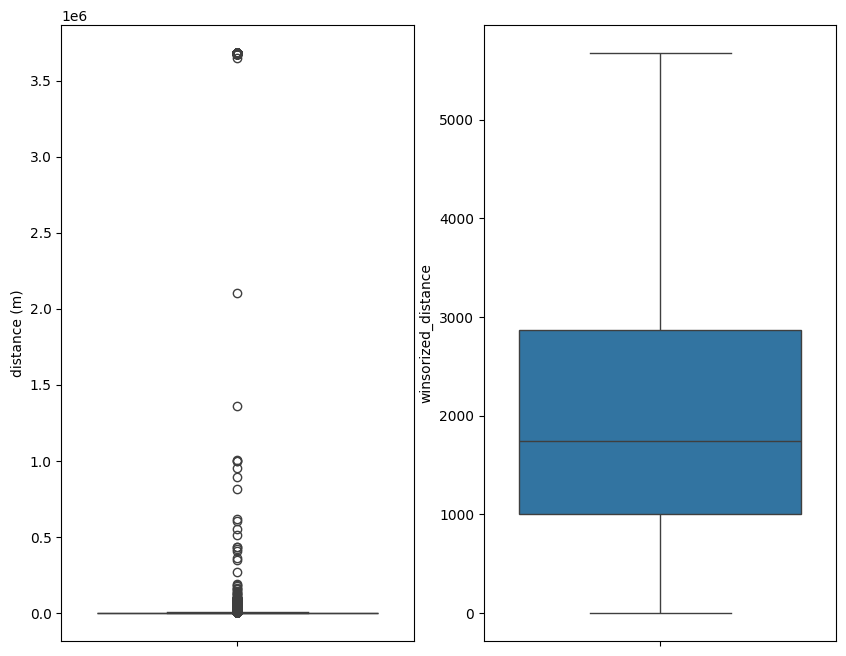

In [29]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.boxplot(df["distance (m)"])
# The are lots of outliers in the distribution of distance

plt.subplot(1,2,2)
sns.boxplot(df['winsorized_distance'])
# From the graph I can see that distance distribution is right skewed

plt.show()



In [30]:
outlier_thresholds(df,"duration (sec.)")

(-596.5, 1911.5)

In [31]:
df['winsorized_duration'] = np.where(df['duration (sec.)'] < -596.5, -596.5,
                              np.where(df['duration (sec.)'] > 1911.5, 1911.5, df['duration (sec.)']))

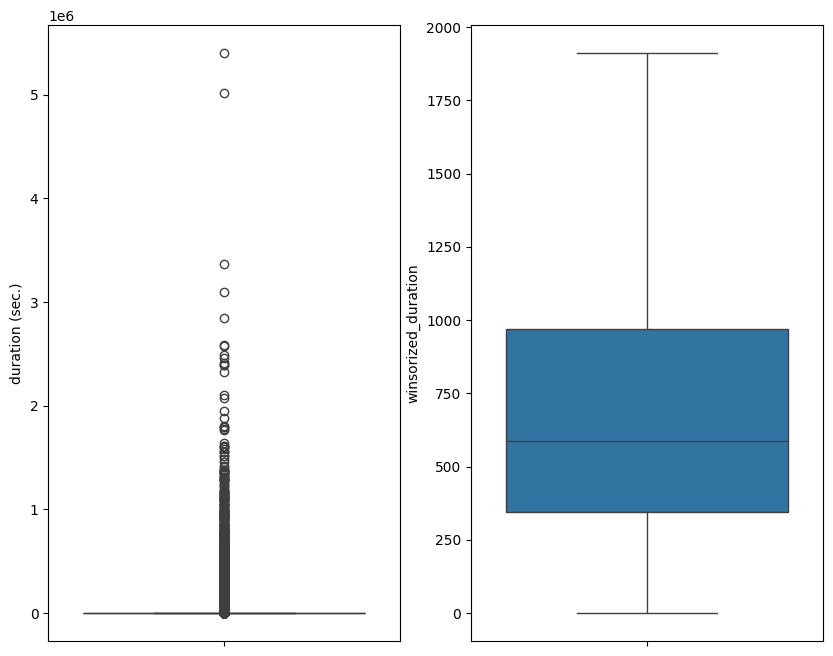

In [32]:
plt.figure(figsize=(10,8))

plt.subplot(1,2,1)
sns.boxplot(df["duration (sec.)"])

plt.subplot(1,2,2)
sns.boxplot(df['winsorized_duration'])

plt.show()

In [33]:
outlier_thresholds(df,"avg_speed (km/h)")

(0.03625808907499037, 0.33092120289303395)

In [34]:
df['winsorized_avg_speed'] = np.where(df['avg_speed (km/h)'] < 0.03625808907499037, 0.03625808907499037,
                              np.where(df['avg_speed (km/h)'] > 0.33092120289303395, 0.33092120289303395, df['avg_speed (km/h)']))

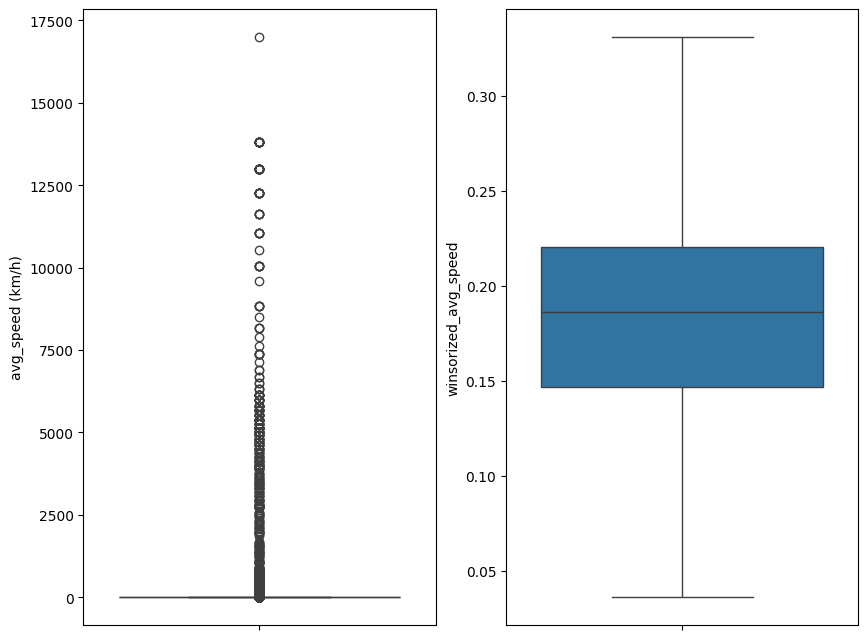

In [35]:
plt.figure(figsize=(10,8))

plt.subplot(1,2,1)
sns.boxplot(df["avg_speed (km/h)"])

plt.subplot(1,2,2)
sns.boxplot(df['winsorized_avg_speed'])

plt.show()

In [36]:
df.head(1)

,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC),winsorized_distance,winsorized_duration,winsorized_avg_speed
0,2020-03-23 06:09:44,2020-03-23 06:16:26,86,Kuusitie,111.0,Esterinportti,1747.000,401.000,0.261,60.195,24.902,60.198,24.927,0.900,1747.000,401.000,0.261


In [37]:
import plotly.express as px

# Create a scatter map plot for DEPARTURE
fig = px.scatter_mapbox(df[:10000], lat='departure_latitude', lon='departure_longitude', hover_name='departure_name',
                        mapbox_style='open-street-map', zoom=10)

fig.show()

# Since shape of the data is (12157458, 14) ram becomes insufficient to graph whole map. That's why I used only first 10000 row.

In [38]:

# Scatter map plot for RETURN
fig = px.scatter_mapbox(df[:10000], lat='return_latitude', lon='return_longitude', hover_name='return_name',
                        mapbox_style='open-street-map', zoom=10)

fig.show()

According to above maps, I can see departure and return coordinates. There are more coordinates around of Helsinki than the other regions.

In [39]:
df["duration_hours"] = df["duration (sec.)"]/3600

In [40]:
# Scatter map plot for DEPARTURE in terms of duration_hours

fig = px.scatter_mapbox(df[:100000], lat='departure_latitude', lon='departure_longitude', hover_name='departure_name', color="duration_hours",
                        size='duration_hours', color_continuous_scale=px.colors.cyclical.IceFire, mapbox_style='open-street-map', zoom=10)

fig.show()

In [41]:
# Scatter map plot for RETURN in terms of duration_hours

fig = px.scatter_mapbox(df[:100000], lat='return_latitude', lon='return_longitude', hover_name='return_name', color="duration_hours",
                        size='duration_hours', color_continuous_scale=px.colors.cyclical.IceFire, mapbox_style='open-street-map', zoom=10)

fig.show()

As can seen from the RETURN and DEPARTURES maps, the most durations in stations Meilahden sairaala (black dot-1392.408 hours), Leppavaarankaytava (yellow dot-861.309 hours), Maarinranta (light blue-268.515 hours) and Haukilahdenkatu (234,81 hours), respectively.

# In which year are the max trips?

In [42]:
import datetime as dt

df["departure_year"] = df["departure"].dt.year
df["return_year"] = df["return"].dt.year

In [43]:
df_groupby_departure_year = df.groupby("departure_year")[["departure"]].count().reset_index()

<Axes: xlabel='departure_year', ylabel='departure'>

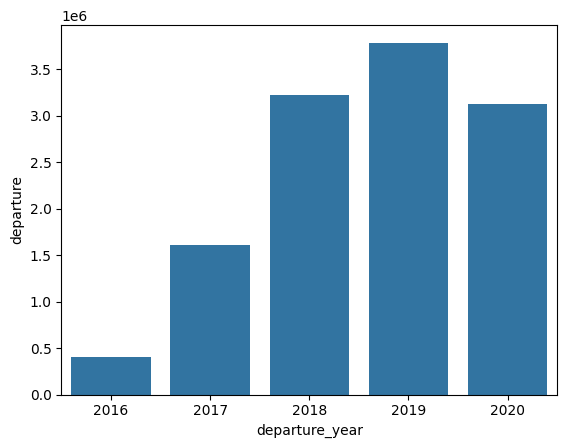

In [44]:
sns.barplot(y="departure", x="departure_year", data=df_groupby_departure_year)

According to bar plot there are the most trips in 2019. It is followed by 2018 and 2020 respectively.

# In which days and at what time are there the max trips?

In [45]:
df["departure_days"] = df["departure"].dt.day_name()
df["departure_time_interval"] = df["departure"].dt.hour

df.loc[df["departure_time_interval"]==0, "departure_time_interval"] = 24 # The hour "0" was converted as "24"

<Axes: xlabel='departure_days', ylabel='departure_time_interval'>

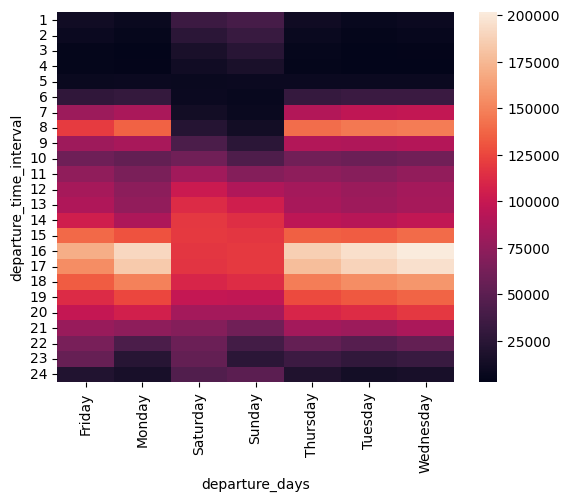

In [46]:
df_heatmap = df[["departure_days",	"departure_time_interval", "departure_name"]]
df_groupby_count = df_heatmap.groupby(["departure_days", "departure_time_interval"]).count().reset_index()
heatmap_dataset = df_groupby_count.pivot(index="departure_time_interval", columns="departure_days", values="departure_name")

sns.heatmap(heatmap_dataset)

As can seen from the heatmap, days with the max trips
are between Monday and Thursday at between 16:00-17:00.
The day with the max trips between Monday-Thursday is Wednesdays at 16:00.
The hour with the max trips in earlier hours is at 08:00.
The days and the hours with the min trips are Saturdays, Sundays and between 24:00 and 06:00, respectively.

Let's look duration:

In [47]:
df[["duration_hours"]].describe().T

# There are 0 in duration

,count,mean,std,min,25%,50%,75%,max
duration_hours,12157285.000,0.267,2.041,0.000,0.096,0.163,0.270,1500.461


In [48]:
df[df["duration_hours"] == 0]

# We can see from the dataset there are rows that distance is 0.

,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC),winsorized_distance,winsorized_duration,winsorized_avg_speed,duration_hours,departure_year,return_year,departure_days,departure_time_interval
4387,2020-03-24 16:35:15,2020-03-25 12:03:05,627,Piispansilta,651.0,Suurpellonaukio,0.000,0.000,0.186,60.162,24.738,60.185,24.744,4.000,0.000,0.000,0.186,0.000,2020,2020,Tuesday,16
10646,2020-03-26 13:23:13,2020-03-28 13:06:49,143,Kuikkarinne,55.0,Puistokaari,0.000,0.000,0.186,60.157,24.869,60.158,24.862,6.300,0.000,0.000,0.186,0.000,2020,2020,Thursday,13
13782,2020-03-26 20:12:21,2020-03-28 18:34:57,25,Narinkka,68.0,Albertinkatu,0.000,0.000,0.186,60.170,24.935,60.162,24.937,4.100,0.000,0.000,0.186,0.000,2020,2020,Thursday,20
17887,2020-03-27 18:44:37,2020-03-27 19:10:50,84,Paciuksenkatu,82.0,Töölöntulli,0.000,0.000,0.186,60.192,24.901,60.191,24.913,5.900,0.000,0.000,0.186,0.000,2020,2020,Friday,18
18918,2020-03-28 00:10:50,2020-03-28 16:57:15,557,Louhentori,751.0,Vallipolku,0.000,0.000,0.186,60.187,24.797,60.228,24.820,4.600,0.000,0.000,0.186,0.000,2020,2020,Saturday,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12079562,2017-10-11 03:57:00,2017-10-11 16:49:00,120.0,Mäkelänkatu,120.0,Mäkelänkatu,0.000,0.000,0.186,60.190,24.964,60.190,24.964,7.900,0.000,0.000,0.186,0.000,2017,2017,Wednesday,3
12080276,2017-10-11 09:09:00,2017-10-11 10:58:00,64.0,Tyynenmerenkatu,64.0,Tyynenmerenkatu,0.000,0.000,0.186,60.157,24.921,60.157,24.921,6.700,0.000,0.000,0.186,0.000,2017,2017,Wednesday,9
12099717,2017-10-15 18:02:00,2017-10-15 18:36:00,18.0,Porthania,18.0,Porthania,0.000,0.000,0.186,60.170,24.948,60.170,24.948,8.600,0.000,0.000,0.186,0.000,2017,2017,Sunday,18
12127921,2017-10-20 19:21:00,2017-10-20 19:48:00,26.0,Kamppi (M),26.0,Kamppi (M),0.000,0.000,0.186,60.169,24.931,60.169,24.931,2.400,0.000,0.000,0.186,0.000,2017,2017,Friday,19


In [49]:
df[df["distance (m)"] == 0]


,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC),winsorized_distance,winsorized_duration,winsorized_avg_speed,duration_hours,departure_year,return_year,departure_days,departure_time_interval
15,2020-03-23 06:57:41,2020-03-23 07:13:49,23,Kiasma,126.0,Kalasatama (M),0.000,963.000,0.000,60.171,24.937,60.188,24.977,0.900,0.000,963.000,0.036,0.268,2020,2020,Monday,6
22,2020-03-23 07:08:28,2020-03-23 07:08:51,270,Tulisuontie,270.0,Tulisuontie,0.000,17.000,0.000,60.202,25.060,60.202,25.060,1.100,0.000,17.000,0.036,0.005,2020,2020,Monday,7
48,2020-03-23 07:34:40,2020-03-23 07:45:07,23,Kiasma,59.0,Salmisaarenranta,0.000,623.000,0.000,60.171,24.937,60.165,24.901,1.100,0.000,623.000,0.036,0.173,2020,2020,Monday,7
50,2020-03-23 07:34:42,2020-03-23 07:59:47,142,Koskelantie,34.0,Kansallismuseo,0.000,1500.000,0.000,60.209,24.947,60.174,24.933,1.100,0.000,1500.000,0.036,0.417,2020,2020,Monday,7
54,2020-03-23 07:40:01,2020-03-23 07:42:45,34,Kansallismuseo,37.0,Töölönkatu,0.000,158.000,0.000,60.174,24.933,60.178,24.928,1.100,0.000,158.000,0.036,0.044,2020,2020,Monday,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12157179,2017-10-30 20:14:00,2017-10-30 20:15:00,114.0,Ratapihantie,114.0,Ratapihantie,0.000,26.000,0.000,60.196,24.936,60.196,24.936,1.200,0.000,26.000,0.036,0.007,2017,2017,Monday,20
12157184,2017-10-30 20:17:00,2017-10-30 20:18:00,26.0,Kamppi (M),26.0,Kamppi (M),0.000,26.000,0.000,60.169,24.931,60.169,24.931,1.200,0.000,26.000,0.036,0.007,2017,2017,Monday,20
12157200,2017-10-30 20:24:00,2017-10-30 20:25:00,58.0,Lauttasaarensilta,58.0,Lauttasaarensilta,0.000,35.000,0.000,60.161,24.890,60.161,24.890,1.200,0.000,35.000,0.036,0.010,2017,2017,Monday,20
12157279,2017-10-30 20:51:00,2017-10-30 21:06:00,110.0,Maistraatintori,123.0,Näkinsilta,0.000,882.000,0.000,60.199,24.925,60.180,24.955,1.200,0.000,882.000,0.036,0.245,2017,2017,Monday,20


As can seen from the dataset above, if departure_name and return_name are same then distance is 0. I mean, the biker came back to the departure. And this is misleading because it's like they have never trip. That's why I need to analyze the duration in such data instead of distance.

And, let's look at 15th row. Although the departure and return are not same, distance is 0 and these stations are not close each other and duration is greater than 0.

So, here there is an issue that I should handle. Let's extract data whose departure and return are not same but distance is 0.

In [50]:
df_different_stations = df.loc[df["departure_name"] != df["return_name"]]

In [51]:
df_different_stations[df_different_stations["distance (m)"] == 0]

,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC),winsorized_distance,winsorized_duration,winsorized_avg_speed,duration_hours,departure_year,return_year,departure_days,departure_time_interval
15,2020-03-23 06:57:41,2020-03-23 07:13:49,23,Kiasma,126.0,Kalasatama (M),0.000,963.000,0.000,60.171,24.937,60.188,24.977,0.900,0.000,963.000,0.036,0.268,2020,2020,Monday,6
48,2020-03-23 07:34:40,2020-03-23 07:45:07,23,Kiasma,59.0,Salmisaarenranta,0.000,623.000,0.000,60.171,24.937,60.165,24.901,1.100,0.000,623.000,0.036,0.173,2020,2020,Monday,7
50,2020-03-23 07:34:42,2020-03-23 07:59:47,142,Koskelantie,34.0,Kansallismuseo,0.000,1500.000,0.000,60.209,24.947,60.174,24.933,1.100,0.000,1500.000,0.036,0.417,2020,2020,Monday,7
54,2020-03-23 07:40:01,2020-03-23 07:42:45,34,Kansallismuseo,37.0,Töölönkatu,0.000,158.000,0.000,60.174,24.933,60.178,24.928,1.100,0.000,158.000,0.036,0.044,2020,2020,Monday,7
62,2020-03-23 07:45:23,2020-03-23 07:59:49,255,Laivalahden puistotie,260.0,Herttoniemi (M),0.000,861.000,0.000,60.188,25.031,60.195,25.029,1.100,0.000,861.000,0.036,0.239,2020,2020,Monday,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12155773,2017-10-30 15:12:00,2017-10-30 15:27:00,82.0,Töölöntulli,33.0,Kauppakorkeakoulu,0.000,900.000,0.000,60.191,24.913,60.171,24.925,2.100,0.000,900.000,0.036,0.250,2017,2017,Monday,15
12156357,2017-10-30 16:52:00,2017-10-30 16:53:00,27.0,Eerikinkatu,7.0,Designmuseo,0.000,18.000,0.000,60.167,24.936,60.163,24.946,1.800,0.000,18.000,0.036,0.005,2017,2017,Monday,16
12156642,2017-10-30 17:41:00,2017-10-30 17:53:00,127.0,Teurastamo,110.0,Maistraatintori,0.000,721.000,0.000,60.190,24.971,60.199,24.925,1.800,0.000,721.000,0.036,0.200,2017,2017,Monday,17
12156937,2017-10-30 18:51:00,2017-10-30 19:01:00,33.0,Kauppakorkeakoulu,60.0,Itämerentori,0.000,561.000,0.000,60.171,24.925,60.164,24.915,1.700,0.000,561.000,0.036,0.156,2017,2017,Monday,18


By the way I catched that avg_speed is 0, as well.

In [52]:
df_different_stations[df_different_stations["distance (m)"] == 0]["avg_speed (km/h)"].mean()

# Mean of avg_speed (km/h) in data whose departure and return are not same but distance is 0, is 0

0.0020196062420258748

And the count is:

In [53]:
df_different_stations[df_different_stations["distance (m)"] == 0]["avg_speed (km/h)"].count()

81483

Well, what can I do with this type of data? I am not in favor of deleting data. I can replace it with mean or median or I can exclude from the analyses.

I decided that I exclude the data from the analyses. Because even if calculate the distance from latitude and longitude, it will equal to almost 0.

In [54]:
df_distance_isnot_zero = df[~(df["distance (m)"] == 0)]

In [55]:
df_distance_isnot_zero["winsorized_distance"].describe().T

count   11769593.000
mean        2143.441
std         1425.823
min            1.000
25%         1057.000
50%         1794.000
75%         2924.000
max         5672.500
Name: winsorized_distance, dtype: float64

#  Effect of air temperature and departure_time_interval interaction on winsorized_distance

<ipython-input-56-7c3d8b2aba92>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: xlabel='temperature_time', ylabel='winsorized_distance'>

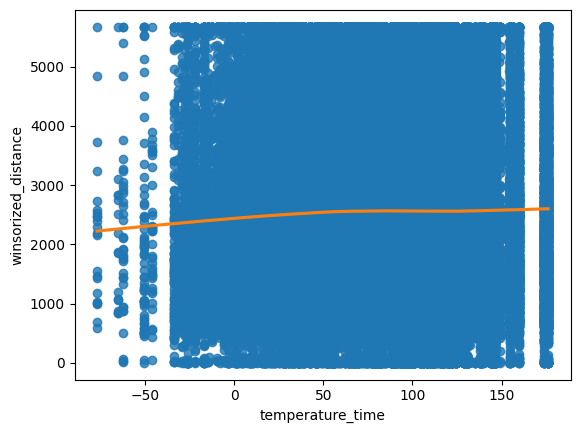

In [56]:
# To determine effect of features interaction on distance I calculated temperature_time by multiplying 2 features and draw a regression line

df_distance_isnot_zero["temperature_time"] = df_distance_isnot_zero["Air temperature (degC)"]*df_distance_isnot_zero["departure_time_interval"]

sns.regplot(x="temperature_time", y="winsorized_distance", data=df_distance_isnot_zero[:100000], lowess=True, line_kws={"color": "C1"}) #Set lowess as True for smoothing in nonparametric regresion

# Since I have row count greater than 10 million, only graphed first 100000

As for above scatterplot with a regression line, we can see there is no interaction effect of air temperature and departure_time_interval on distance.

In [57]:
outlier_thresholds(df,"duration_hours")

(-0.16569444444444442, 0.5309722222222222)

In [58]:
df['winsorized_duration_hours'] = np.where(df['duration_hours'] < -0.16569444444444442, -0.16569444444444442,
                              np.where(df['duration_hours'] > 0.5309722222222222, 0.5309722222222222, df['duration_hours']))

In [ ]:
plt.figure(figsize=(10,8))

plt.subplot(1,2,1)
sns.boxplot(df["duration_hours"])

plt.subplot(1,2,2)
sns.boxplot(df['winsorized_duration_hours'])

plt.show()

As can seen from the above boxplots, there are lots of outliers in duration. I winsorized the values using 1st and 3rd quartile and obtained the graph in the right. There is an effect of outliers in the original data on the distribution. Thus, I am not sure about winsorized. Although, I wanted to observe whether there is an effect of features interaction on duration_hours or not.

In [ ]:
# To determine effect of features interaction on duration_hours I drew a regression line

sns.regplot(x="temperature_time", y="winsorized_duration_hours", data=df[:10000], lowess=True, line_kws={"color": "C1"})

As for above scatterplot with a regression line, we can see that there is no interaction effect of air temperature and departure_time_interval on duration.